# Gene Expression Visualization: K562 data (Replogle 2022)
- download `K562_essential_raw_singlecell_01.h5ad` from [https://plus.figshare.com/articles/dataset/_Mapping_information-rich_genotype-phenotype_landscapes_with_genome-scale_Perturb-seq_Replogle_et_al_2022_processed_Perturb-seq_datasets/20029387](https://plus.figshare.com/articles/dataset/_Mapping_information-rich_genotype-phenotype_landscapes_with_genome-scale_Perturb-seq_Replogle_et_al_2022_processed_Perturb-seq_datasets/20029387) and save it to `/WhyDOE_RWD_Analysis/`
- run codes in `01_preprocessing.ipynb` to have the processed data `K562_processed.h5ad`

In [18]:
import gseapy as gp
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import random
import scanpy as sc
import seaborn as sns

from tools.preferences import level_cmap, seurat, outputdir, kwarg_savefig
from tools.bioinfo import GeneList
import tools.bioinfo.scanpy_extensions as sce
from tools.grn import HillClimbSearch
from tools.grn.grn_features import *

In [2]:
df = sc.read_h5ad("./K562_processed.h5ad")

In [3]:
hallmark = gp.get_library(name='MSigDB_Hallmark_2020', organism='Human')
hallmark.keys()

INFO:root:Downloading and generating Enrichr library gene sets...


dict_keys(['TNF-alpha Signaling via NF-kB', 'Hypoxia', 'Cholesterol Homeostasis', 'Mitotic Spindle', 'Wnt-beta Catenin Signaling', 'TGF-beta Signaling', 'IL-6/JAK/STAT3 Signaling', 'DNA Repair', 'G2-M Checkpoint', 'Apoptosis', 'Notch Signaling', 'Adipogenesis', 'Estrogen Response Early', 'Estrogen Response Late', 'Androgen Response', 'Myogenesis', 'Protein Secretion', 'Interferon Alpha Response', 'Interferon Gamma Response', 'Apical Junction', 'Apical Surface', 'Hedgehog Signaling', 'Complement', 'Unfolded Protein Response', 'PI3K/AKT/mTOR  Signaling', 'mTORC1 Signaling', 'E2F Targets', 'Myc Targets V1', 'Myc Targets V2', 'Epithelial Mesenchymal Transition', 'Inflammatory Response', 'Xenobiotic Metabolism', 'Fatty Acid Metabolism', 'Oxidative Phosphorylation', 'Glycolysis', 'Reactive Oxygen Species Pathway', 'p53 Pathway', 'UV Response Up', 'UV Response Dn', 'Angiogenesis', 'heme Metabolism', 'Coagulation', 'IL-2/STAT5 Signaling', 'Bile Acid Metabolism', 'Pperoxisome', 'Allograft Rejec

In [4]:
import logging
logging.getLogger("fontTools").setLevel(logging.WARNING)
logging.getLogger("pgmpy").setLevel(logging.WARNING)

---
## Cell Cycle

In [5]:
s_genes = GeneList(
    adata=df, key="s_phase_exclusive", category="E2F Targets", 
    database=hallmark, preset=True, caption="S phase"
)
g2m_genes = GeneList(
    adata=df, key="g2m_phase_exclusive", category="G2-M Checkpoint", 
    database=hallmark, preset=True, caption="G2/M phase"
)

[Cache Hit] Loading 's_phase_exclusive'...
[Cache Hit] Loading 'g2m_phase_exclusive'...


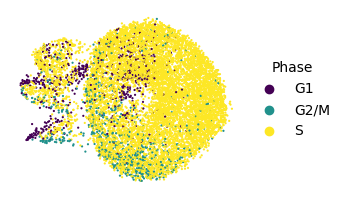

In [6]:
fig, ax = plt.subplots(figsize=(3, 3))

sce.pl.umap(
    df, ax=ax, size=10, color="phase", palette="viridis", title="Phase"
)

fig.savefig(f"{outputdir}/phase.pdf", **kwarg_savefig)

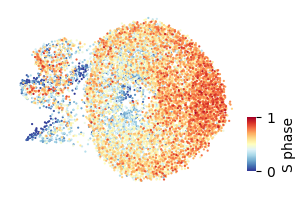

In [7]:
fig, ax = plt.subplots(figsize=(3, 3))

sce.pl.umap(
    df, ax=ax, size=10, color="S_score_prob", 
    palette="viridis", title=s_genes.caption, 
    vmax=1, vmin=0, cmap="RdYlBu_r"
)

fig.savefig(f"{outputdir}/S_score.pdf", **kwarg_savefig)

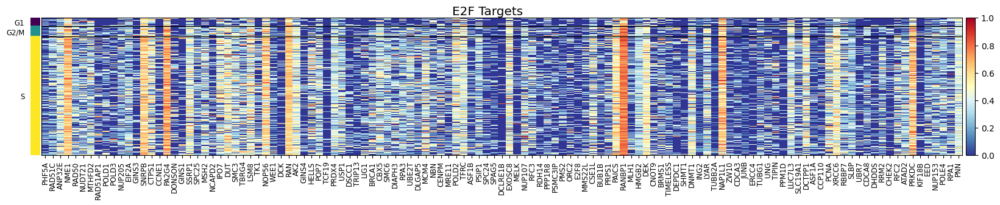

In [8]:
axes_dict = sc.pl.heatmap(
    df,
    var_names=s_genes.genes,
    groupby="phase",
    gene_symbols="gene_name",
    standard_scale="var",
    show_gene_labels=True,
    swap_axes=False,
    figsize=(20, 3),
    show=False,
    cmap="RdYlBu_r",
    rasterized=True
)

heatmap_ax, group_ax = axes_dict.values()
group_ax.set(ylabel="");
group_ax.set_xticklabels(group_ax.get_xticklabels(), rotation=0)


fig = heatmap_ax.figure
fig.suptitle(
    s_genes.category, 
    fontsize="x-large",
    y=0.93
)

fig.savefig(f"{outputdir}/S_signature.pdf", **kwarg_savefig)

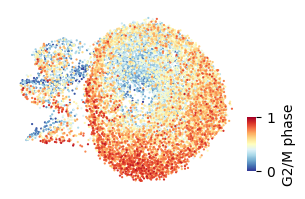

In [9]:
fig, ax = plt.subplots(figsize=(3, 3))

sce.pl.umap(
    df, ax=ax, size=10, color="G2M_score_prob", 
    palette="viridis", title=g2m_genes.caption, 
    vmax=1, vmin=0, cmap="RdYlBu_r"
)

fig.savefig(f"{outputdir}/G2M_score.pdf", **kwarg_savefig)

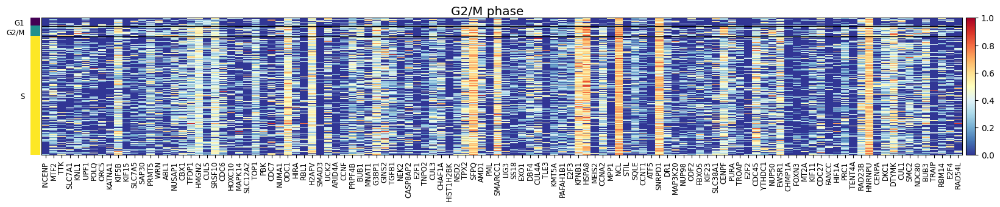

In [10]:
axes_dict = sc.pl.heatmap(
    df,
    var_names=g2m_genes.genes,
    groupby="phase",
    gene_symbols="gene_name",
    standard_scale="var",
    show_gene_labels=True,
    swap_axes=False,
    figsize=(20, 3),
    show=False,
    cmap="RdYlBu_r",
    rasterized=True
)

heatmap_ax, group_ax = axes_dict.values()
group_ax.set(ylabel="");
group_ax.set_xticklabels(group_ax.get_xticklabels(), rotation=0)

fig = heatmap_ax.figure
fig.suptitle(
    g2m_genes.caption, 
    fontsize="x-large",
    y=0.93
)

fig.savefig(f"{outputdir}/G2M_signature.pdf", **kwarg_savefig)

In [11]:
gl = GeneList(
    df, key="upr", category="Unfolded Protein Response",
    database=hallmark, preset=True,
    caption="UPR"
)

[Cache Hit] Loading 'upr'...


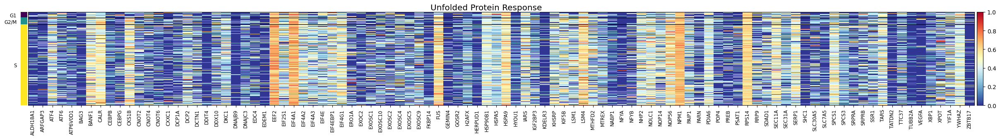

In [12]:
axes_dict = sc.pl.heatmap(
    gl.data,
    var_names=gl.genes,
    groupby="phase",
    gene_symbols="gene_name",
    standard_scale="var",
    show_gene_labels=True,
    swap_axes=False,
    figsize=(30, 3),
    show=False,
    cmap="RdYlBu_r",
    rasterized=True
)

heatmap_ax, group_ax = axes_dict.values()
group_ax.set(ylabel="");
group_ax.set_xticklabels(group_ax.get_xticklabels(), rotation=0)

fig = heatmap_ax.figure
fig.suptitle(
    gl.category, 
    fontsize="x-large",
    y=0.93
)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_heatmap.pdf", **kwarg_savefig)

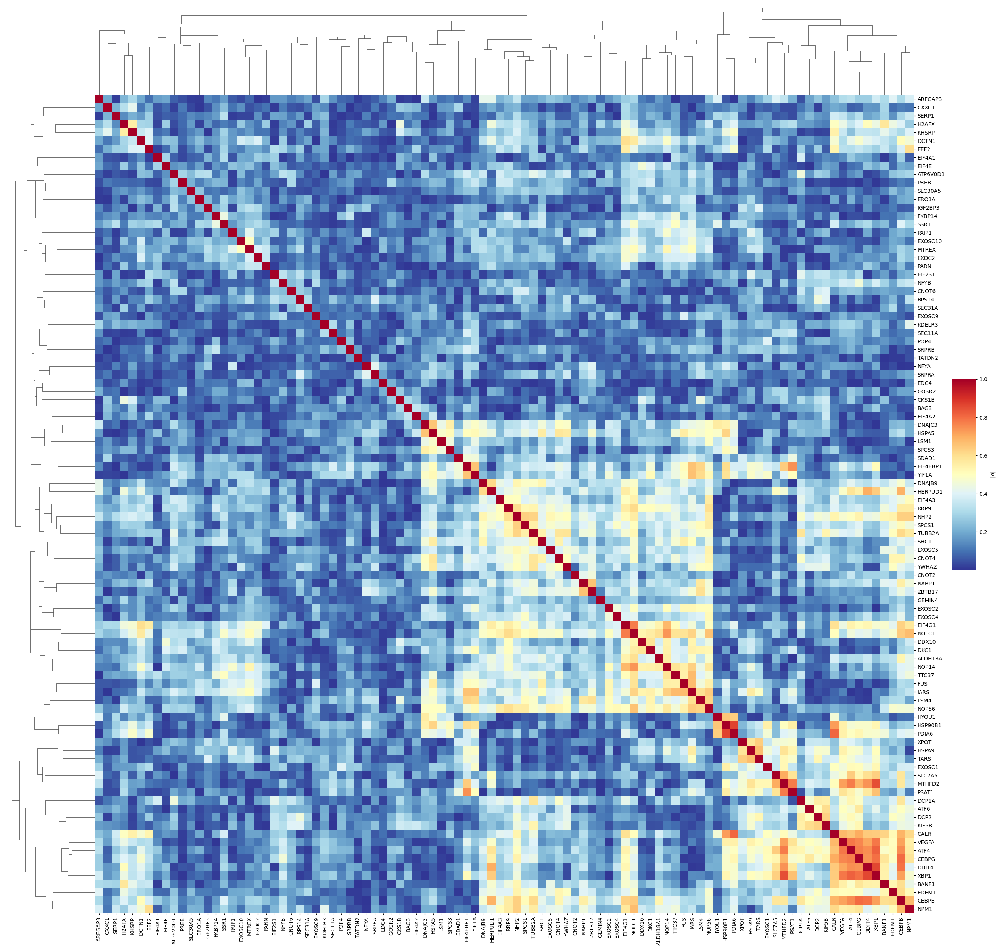

In [13]:
data = gl.data.to_df().assign(
    MetaCell=gl.data.obs["SEACells"]
).groupby("MetaCell", observed=False).mean()
data.columns.name = ""

clustergrid = sns.clustermap(
    data.corr().abs(),
    figsize=(25, 25),
    cbar_pos=(1, .4, .025, .2), 
    dendrogram_ratio=0.1, cmap="RdYlBu_r",
    xticklabels=gl.genes, yticklabels=gl.genes,
    cbar_kws={"label": r"$|\rho|$"},
    rasterized=True
)

plt.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_corr_all.pdf", **kwarg_savefig)

In [23]:
genes, ids = gl.select_correlated_genes(n_top=20)

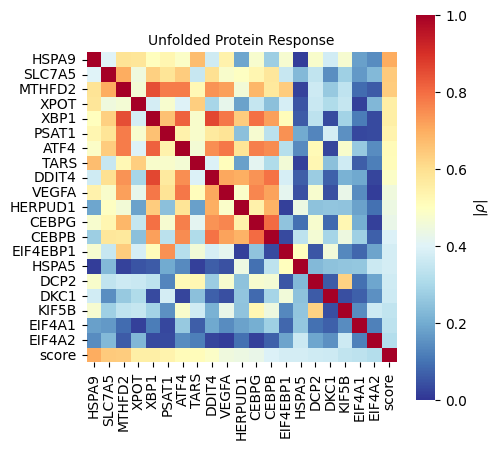

In [24]:
fig, ax = plt.subplots(figsize=(5, 5))

sns.heatmap(
    gl.get_matrix(with_score=True).corr().abs(),
    vmax=1, vmin=0, cmap="RdYlBu_r", square=True, 
    cbar_kws={"label": r"$|\rho|$"}, rasterized=True
)

ax.set(xlabel="", ylabel="");
ax.set_title(gl.category, fontsize="medium")

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_corr.pdf", **kwarg_savefig)

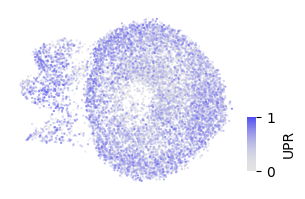

In [25]:
fig, ax = plt.subplots(figsize=(3, 3))

sce.pl.umap(
    gl.data, ax=ax, size=10,
    color=gl.score_prob_name, vmax=1, vmin=0, cmap=seurat,
    alpha=gl.data.obs[gl.score_prob_name], title=gl.caption
)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_score.pdf", **kwarg_savefig)

In [26]:
np.random.seed(0)
random.seed(0)

grn = HillClimbSearch(gene_list=gl, output_value="S_score_prob")

  0%|          | 0/1000000 [00:00<?, ?it/s]

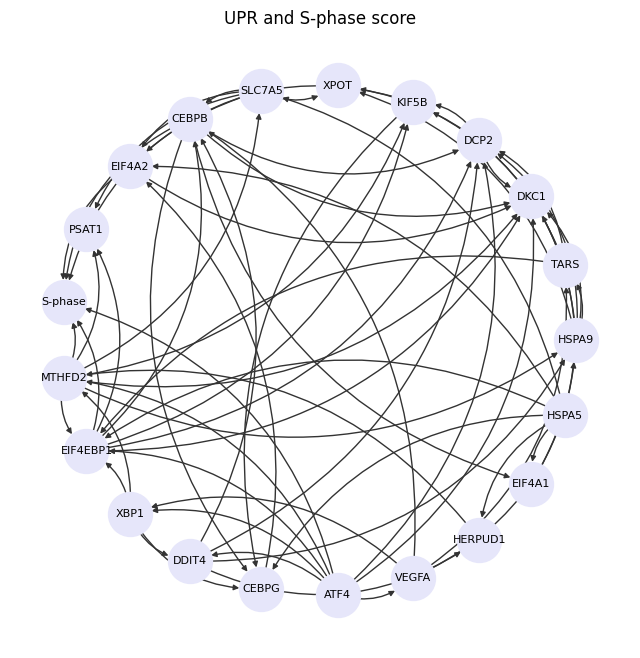

In [27]:
plt.subplots(figsize=(8, 8))

grn.draw_graph(
    with_labels=True, 
    output_label="S-phase",
    node_color="lavender", edge_color=".2", 
    node_size=1000, font_size=8, width=1,
    arrows=True, arrowsize=8,
    connectionstyle="arc3,rad=0.3"
)

plt.title(f"{gl.caption} and S-phase score")
plt.show()

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_grn_all.pdf", **kwarg_savefig)

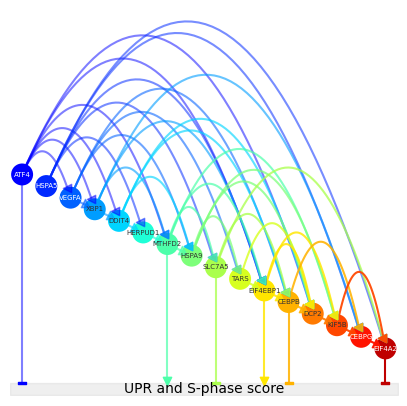

In [28]:
fig, ax = plt.subplots(figsize=(5, 5))

grn.draw_grn(
    ax=ax, 
    output_label=f"{gl.caption.replace('_', ' ')} and S-phase score",
    markersize=250, fontsize=5
)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_grn.pdf", **kwarg_savefig)

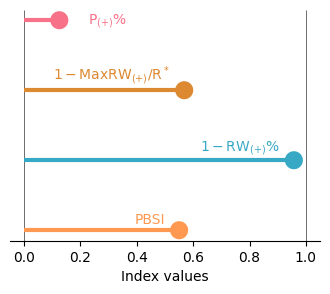

In [29]:
fig, ax = plt.subplots(figsize=(4, 3))

plot_grn_metrics(ax=ax, arr=grn.grn_arr)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_metrics.pdf", **kwarg_savefig)

---
## Myc response (V1)

In [135]:
gl = GeneList(
    df, key="myc_v1", category="Myc Targets V1",
    database=hallmark, preset=True,
    caption="Myc Response"
)

[Cache Hit] Loading 'myc_v1'...


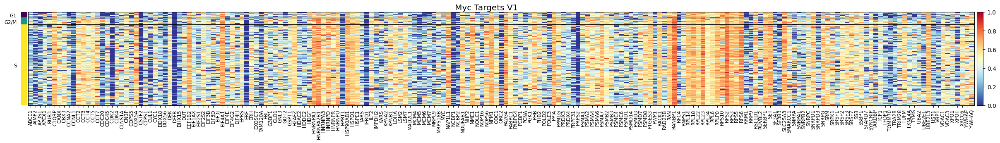

In [31]:
axes_dict = sc.pl.heatmap(
    gl.data,
    var_names=gl.genes,
    groupby="phase",
    gene_symbols="gene_name",
    standard_scale="var",
    show_gene_labels=True,
    swap_axes=False,
    figsize=(30, 3),
    show=False,
    cmap="RdYlBu_r",
    rasterized=True
)

heatmap_ax, group_ax = axes_dict.values()
group_ax.set(ylabel="");
group_ax.set_xticklabels(group_ax.get_xticklabels(), rotation=0)

fig = heatmap_ax.figure
fig.suptitle(
    gl.category, 
    fontsize="x-large",
    y=0.93
)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_heatmap.pdf", **kwarg_savefig)

/home/yokano/.local/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/yokano/.local/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


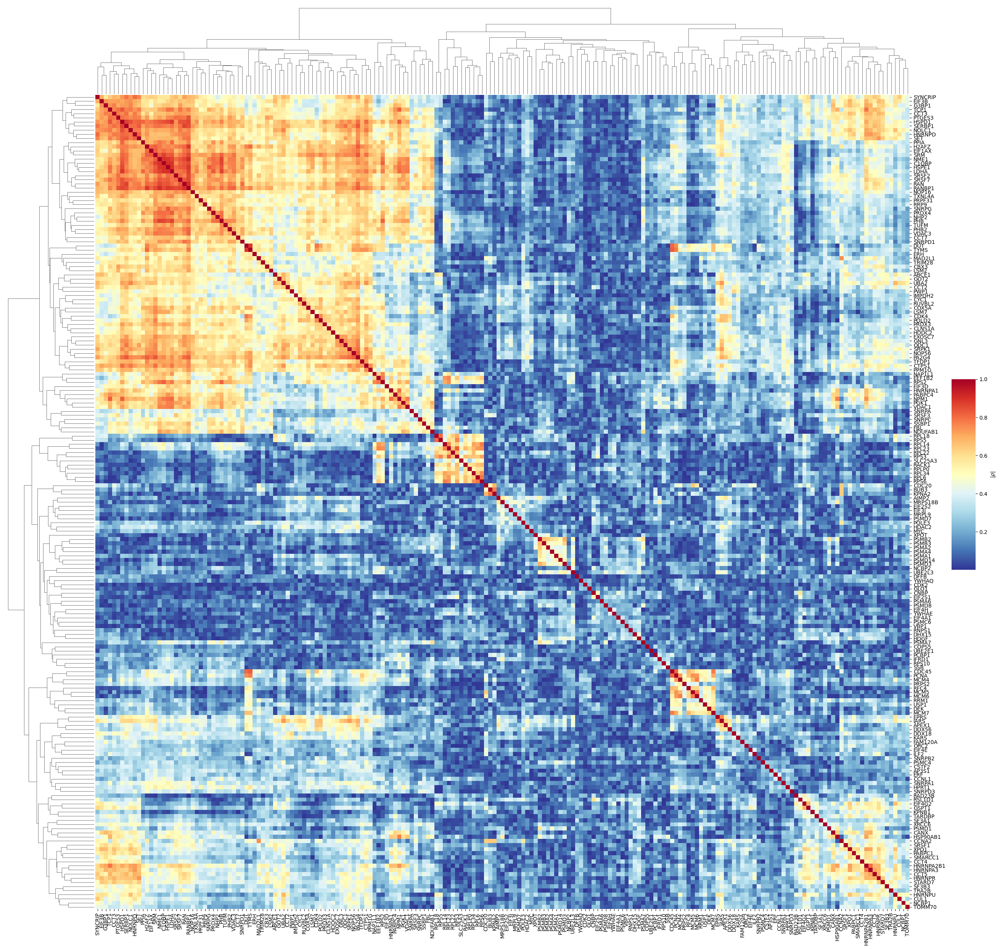

In [32]:
data = gl.data.to_df().assign(
    MetaCell=gl.data.obs["SEACells"]
).groupby("MetaCell", observed=False).mean()
data.columns.name = ""

clustergrid = sns.clustermap(
    data.corr().abs(),
    figsize=(25, 25),
    cbar_pos=(1, .4, .025, .2), 
    dendrogram_ratio=0.1, cmap="RdYlBu_r",
    xticklabels=gl.genes, yticklabels=gl.genes,
    cbar_kws={"label": r"$|\rho|$"},
    rasterized=True
)

plt.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_corr_all.pdf", **kwarg_savefig)

In [33]:
genes, ids = gl.select_correlated_genes(n_top=20)

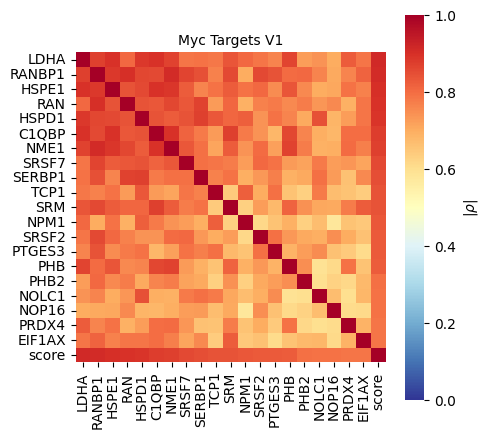

In [34]:
fig, ax = plt.subplots(figsize=(5, 5))

sns.heatmap(
    gl.get_matrix(with_score=True).corr().abs(),
    vmax=1, vmin=0, cmap="RdYlBu_r", square=True, 
    cbar_kws={"label": r"$|\rho|$"}, rasterized=True
)

ax.set(xlabel="", ylabel="");
ax.set_title(gl.category, fontsize="medium")

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_corr.pdf", **kwarg_savefig)

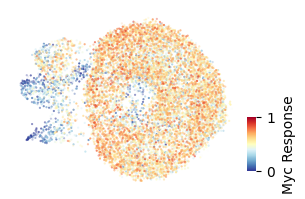

In [136]:
fig, ax = plt.subplots(figsize=(3, 3))

sce.pl.umap(
    gl.data, ax=ax, size=10,
    color=gl.score_prob_name, vmax=1, vmin=0, cmap="RdYlBu_r",
    alpha=gl.data.obs[gl.score_prob_name], title=gl.caption
)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_score.pdf", **kwarg_savefig)

In [36]:
np.random.seed(0)
random.seed(0)

grn = HillClimbSearch(gene_list=gl, output_value="S_score_prob")

  0%|          | 0/1000000 [00:00<?, ?it/s]

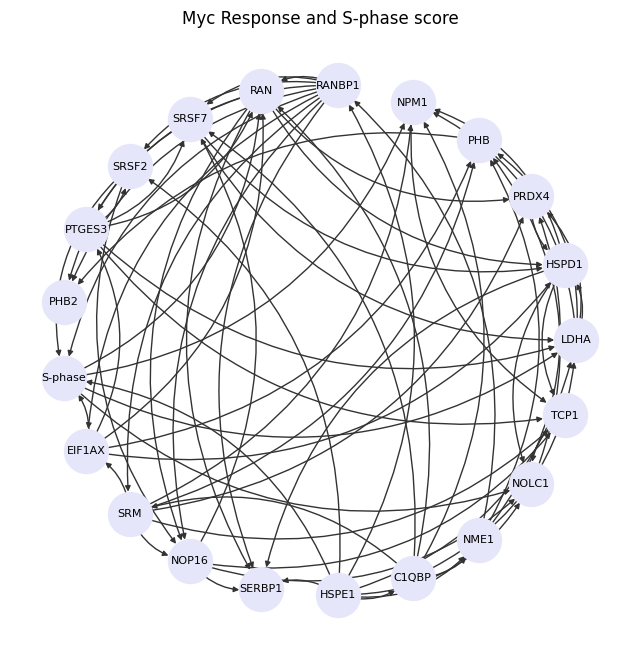

In [37]:
plt.subplots(figsize=(8, 8))

grn.draw_graph(
    with_labels=True, 
    output_label="S-phase",
    node_color="lavender", edge_color=".2", 
    node_size=1000, font_size=8, width=1,
    arrows=True, arrowsize=8,
    connectionstyle="arc3,rad=0.3"
)

plt.title(f"{gl.caption} and S-phase score")
plt.show()

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_grn_all.pdf", **kwarg_savefig)

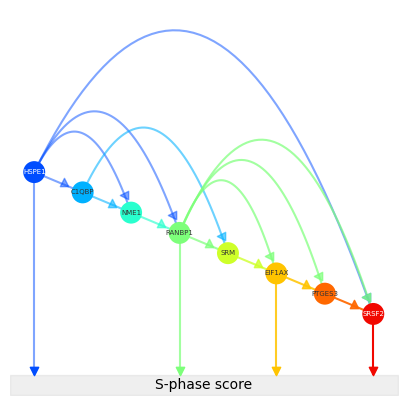

In [41]:
fig, ax = plt.subplots(figsize=(5, 5))

grn.draw_grn(
    ax=ax, 
    output_label="S-phase score",
    markersize=250, fontsize=5
)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_grn.pdf", **kwarg_savefig)

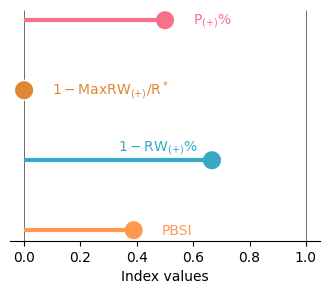

In [42]:
fig, ax = plt.subplots(figsize=(4, 3))

plot_grn_metrics(ax=ax, arr=grn.grn_arr)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_metrics.pdf", **kwarg_savefig)

---
## Apoptosis

In [137]:
gl = GeneList(
    df, key="apoptosis", category="Apoptosis",
    database=hallmark, preset=True,
)

[Cache Hit] Loading 'apoptosis'...


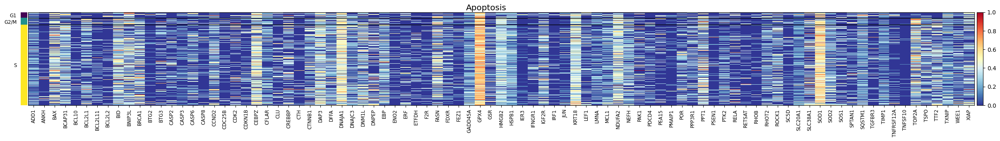

In [48]:
axes_dict = sc.pl.heatmap(
    gl.data,
    var_names=gl.genes,
    groupby="phase",
    gene_symbols="gene_name",
    standard_scale="var",
    show_gene_labels=True,
    swap_axes=False,
    figsize=(30, 3),
    show=False,
    cmap="RdYlBu_r",
    rasterized=True
)

heatmap_ax, group_ax = axes_dict.values()
group_ax.set(ylabel="");
group_ax.set_xticklabels(group_ax.get_xticklabels(), rotation=0)

fig = heatmap_ax.figure
fig.suptitle(
    gl.category, 
    fontsize="x-large",
    y=0.93
)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_heatmap.pdf", **kwarg_savefig)

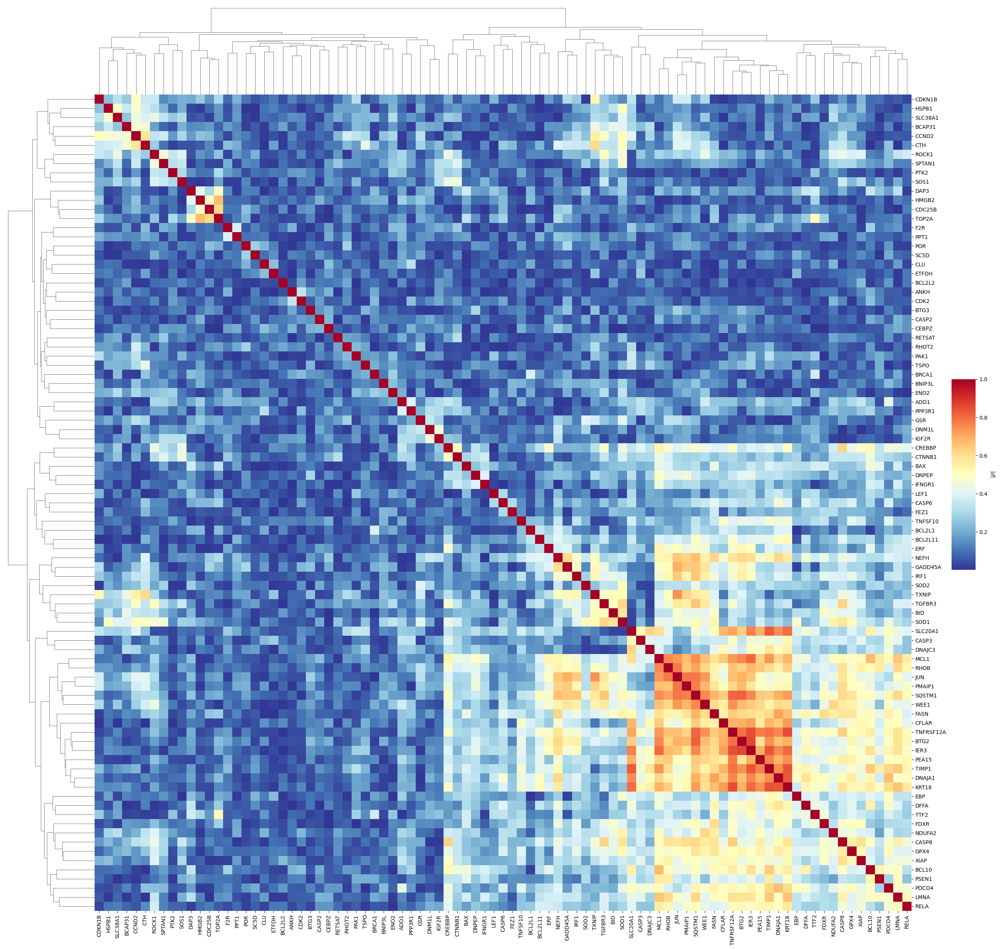

In [49]:
data = gl.data.to_df().assign(
    MetaCell=gl.data.obs["SEACells"]
).groupby("MetaCell", observed=False).mean()
data.columns.name = ""

clustergrid = sns.clustermap(
    data.corr().abs(),
    figsize=(25, 25),
    cbar_pos=(1, .4, .025, .2), 
    dendrogram_ratio=0.1, cmap="RdYlBu_r",
    xticklabels=gl.genes, yticklabels=gl.genes,
    cbar_kws={"label": r"$|\rho|$"},
    rasterized=True
)

plt.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_corr_all.pdf", **kwarg_savefig)

In [50]:
genes, ids = gl.select_independent_genes(n_top=20)

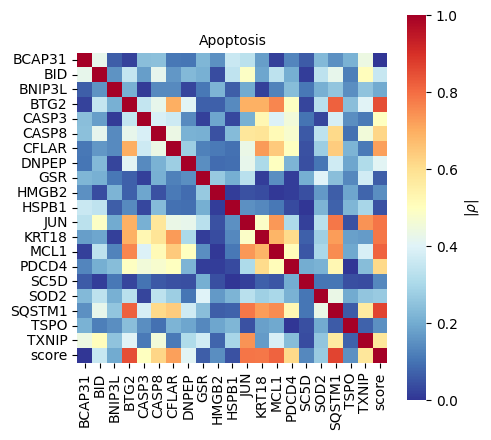

In [51]:
fig, ax = plt.subplots(figsize=(5, 5))

sns.heatmap(
    gl.get_matrix(with_score=True).corr().abs(),
    vmax=1, vmin=0, cmap="RdYlBu_r", square=True, 
    cbar_kws={"label": r"$|\rho|$"}, rasterized=True
)

ax.set(xlabel="", ylabel="");
ax.set_title(gl.category, fontsize="medium")

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_corr.pdf", **kwarg_savefig)

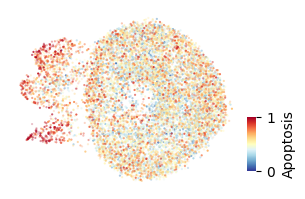

In [138]:
fig, ax = plt.subplots(figsize=(3, 3))

sce.pl.umap(
    gl.data, ax=ax, size=10,
    color=gl.score_prob_name, vmax=1, vmin=0, cmap="RdYlBu_r",
    alpha=gl.data.obs[gl.score_prob_name], title=gl.caption
)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_score.pdf", **kwarg_savefig)

In [53]:
np.random.seed(0)
random.seed(0)

grn = HillClimbSearch(gene_list=gl, output_value="S_score_prob")

  0%|          | 0/1000000 [00:00<?, ?it/s]

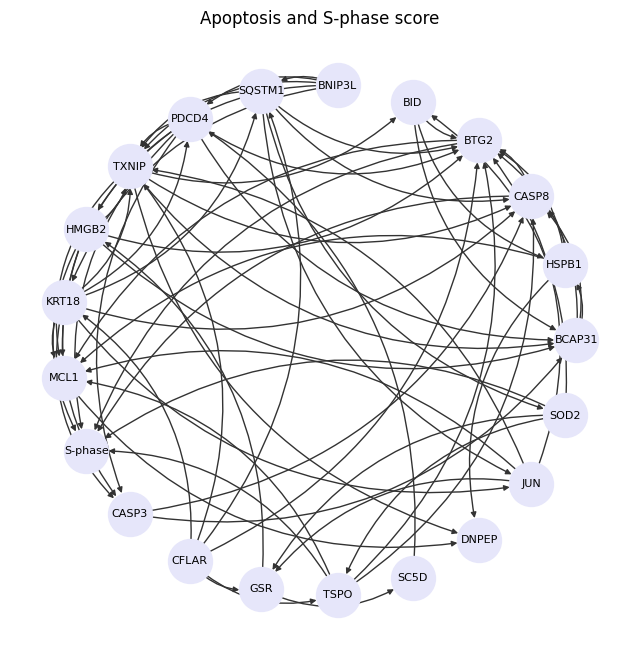

In [54]:
plt.subplots(figsize=(8, 8))

grn.draw_graph(
    with_labels=True, 
    output_label="S-phase",
    node_color="lavender", edge_color=".2", 
    node_size=1000, font_size=8, width=1,
    arrows=True, arrowsize=8,
    connectionstyle="arc3,rad=0.3"
)

plt.title(f"{gl.caption} and S-phase score")
plt.show()

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_grn_all.pdf", **kwarg_savefig)

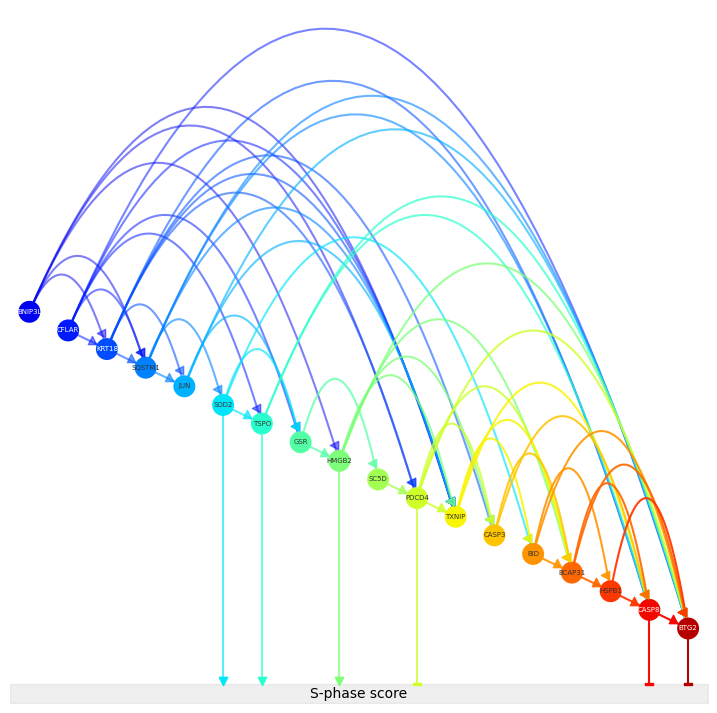

In [58]:
fig, ax = plt.subplots(figsize=(9, 9))

grn.draw_grn(
    ax=ax, 
    output_label="S-phase score",
    markersize=250, fontsize=5
)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_grn.pdf", **kwarg_savefig)

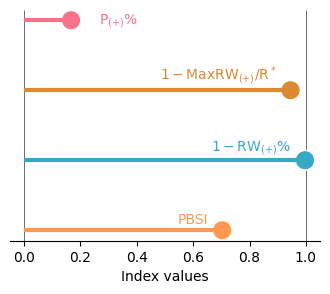

In [56]:
fig, ax = plt.subplots(figsize=(4, 3))

plot_grn_metrics(ax=ax, arr=grn.grn_arr)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_metrics.pdf", **kwarg_savefig)

In [63]:
gl = GeneList(
    df, key="hypoxia", category="Hypoxia",
    database=hallmark, preset=True,
)

[Cache Hit] Loading 'hypoxia'...


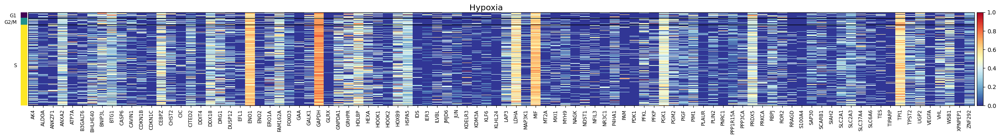

In [64]:
axes_dict = sc.pl.heatmap(
    gl.data,
    var_names=gl.genes,
    groupby="phase",
    gene_symbols="gene_name",
    standard_scale="var",
    show_gene_labels=True,
    swap_axes=False,
    figsize=(30, 3),
    show=False,
    cmap="RdYlBu_r",
    rasterized=True
)

heatmap_ax, group_ax = axes_dict.values()
group_ax.set(ylabel="");
group_ax.set_xticklabels(group_ax.get_xticklabels(), rotation=0)

fig = heatmap_ax.figure
fig.suptitle(
    gl.category, 
    fontsize="x-large",
    y=0.93
)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_heatmap.pdf", **kwarg_savefig)

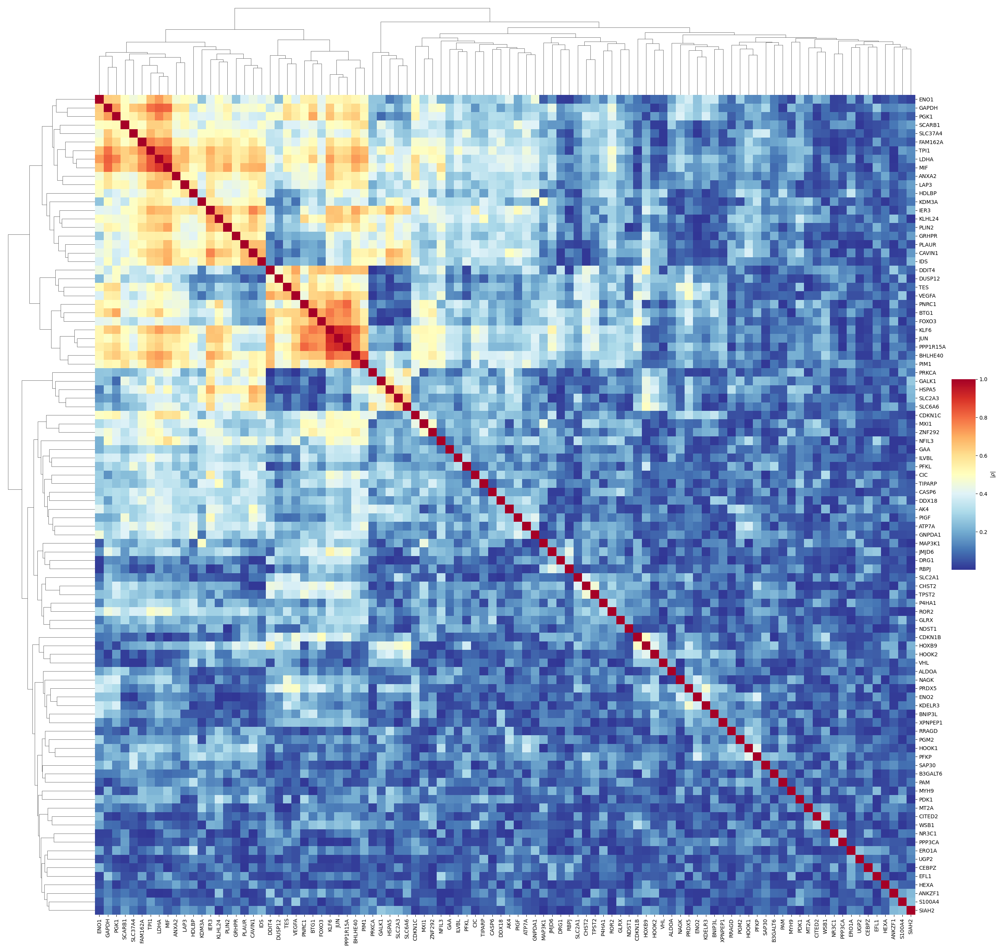

In [65]:
data = gl.data.to_df().assign(
    MetaCell=gl.data.obs["SEACells"]
).groupby("MetaCell", observed=False).mean()
data.columns.name = ""

clustergrid = sns.clustermap(
    data.corr().abs(),
    figsize=(25, 25),
    cbar_pos=(1, .4, .025, .2), 
    dendrogram_ratio=0.1, cmap="RdYlBu_r",
    xticklabels=gl.genes, yticklabels=gl.genes,
    cbar_kws={"label": r"$|\rho|$"},
    rasterized=True
)

plt.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_corr_all.pdf", **kwarg_savefig)

In [66]:
genes, ids = gl.select_independent_genes(n_top=20)

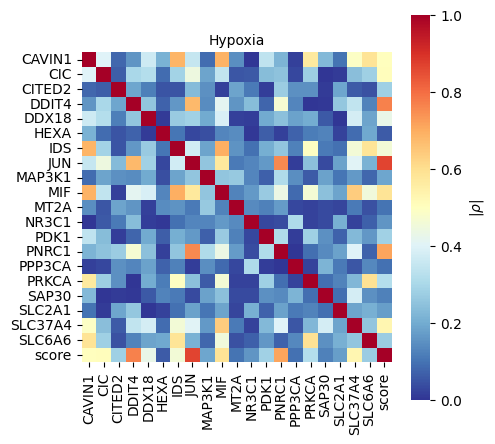

In [67]:
fig, ax = plt.subplots(figsize=(5, 5))

sns.heatmap(
    gl.get_matrix(with_score=True).corr().abs(),
    vmax=1, vmin=0, cmap="RdYlBu_r", square=True, 
    cbar_kws={"label": r"$|\rho|$"}, rasterized=True
)

ax.set(xlabel="", ylabel="");
ax.set_title(gl.category, fontsize="medium")

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_corr.pdf", **kwarg_savefig)

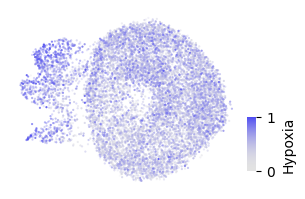

In [68]:
fig, ax = plt.subplots(figsize=(3, 3))

sce.pl.umap(
    gl.data, ax=ax, size=10,
    color=gl.score_prob_name, vmax=1, vmin=0, cmap=seurat,
    alpha=gl.data.obs[gl.score_prob_name], title=gl.caption
)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_score.pdf", **kwarg_savefig)

In [69]:
np.random.seed(0)
random.seed(0)

grn = HillClimbSearch(gene_list=gl, output_value="S_score_prob")

  0%|          | 0/1000000 [00:00<?, ?it/s]

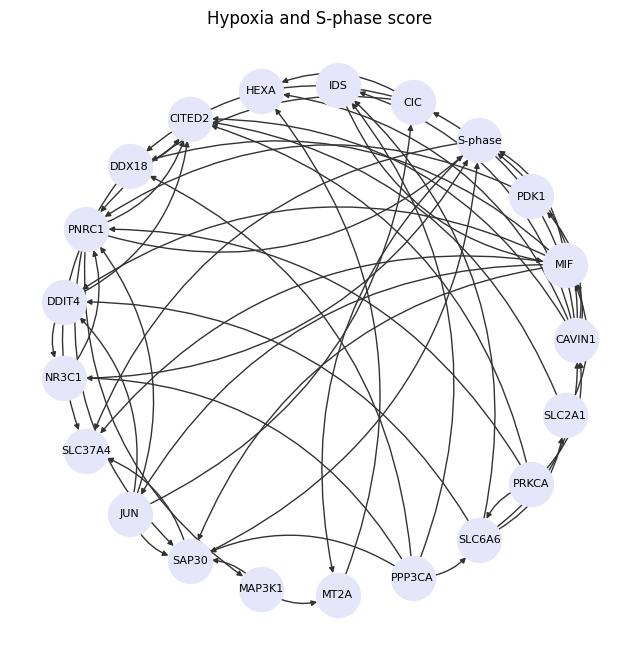

In [70]:
plt.subplots(figsize=(8, 8))

grn.draw_graph(
    with_labels=True, 
    output_label="S-phase",
    node_color="lavender", edge_color=".2", 
    node_size=1000, font_size=8, width=1,
    arrows=True, arrowsize=8,
    connectionstyle="arc3,rad=0.3"
)

plt.title(f"{gl.caption} and S-phase score")
plt.show()

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_grn_all.pdf", **kwarg_savefig)

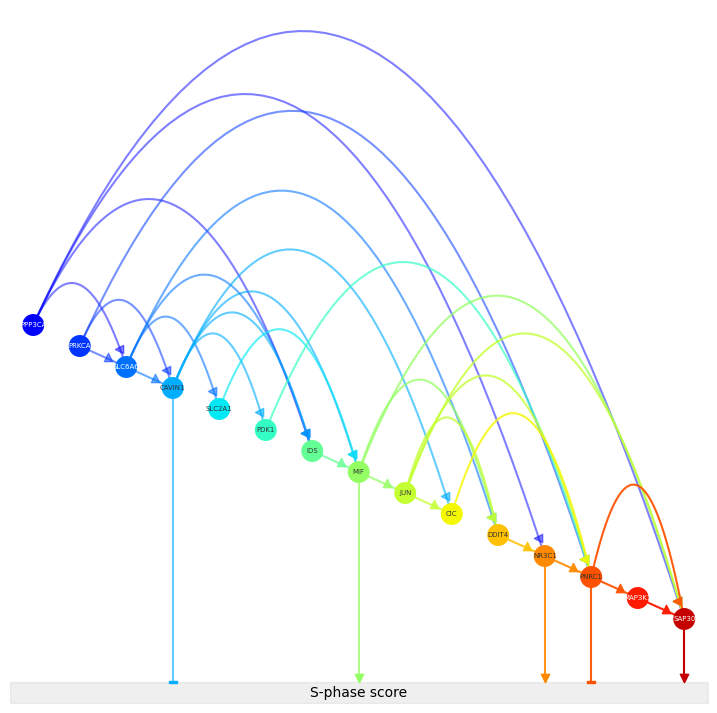

In [73]:
fig, ax = plt.subplots(figsize=(9, 9))

grn.draw_grn(
    ax=ax, 
    output_label="S-phase score",
    markersize=250, fontsize=5
)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_grn.pdf", **kwarg_savefig)

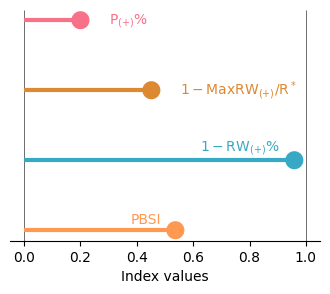

In [72]:
fig, ax = plt.subplots(figsize=(4, 3))

plot_grn_metrics(ax=ax, arr=grn.grn_arr)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_metrics.pdf", **kwarg_savefig)

In [74]:
gl = GeneList(
    df, key="oxidative_phosphorylation", category="Oxidative Phosphorylation",
    database=hallmark, preset=False,
)

[Cache Hit] Loading 'oxidative_phosphorylation'...


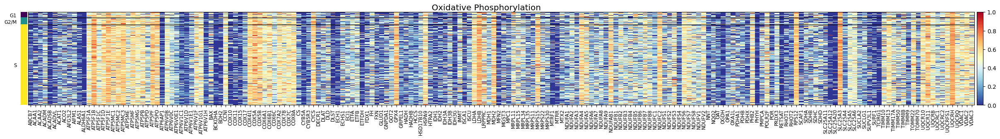

In [75]:
axes_dict = sc.pl.heatmap(
    gl.data,
    var_names=gl.genes,
    groupby="phase",
    gene_symbols="gene_name",
    standard_scale="var",
    show_gene_labels=True,
    swap_axes=False,
    figsize=(30, 3),
    show=False,
    cmap="RdYlBu_r",
    rasterized=True
)

heatmap_ax, group_ax = axes_dict.values()
group_ax.set(ylabel="");
group_ax.set_xticklabels(group_ax.get_xticklabels(), rotation=0)

fig = heatmap_ax.figure
fig.suptitle(
    gl.category, 
    fontsize="x-large",
    y=0.93
)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_heatmap.pdf", **kwarg_savefig)

/home/yokano/.local/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/yokano/.local/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


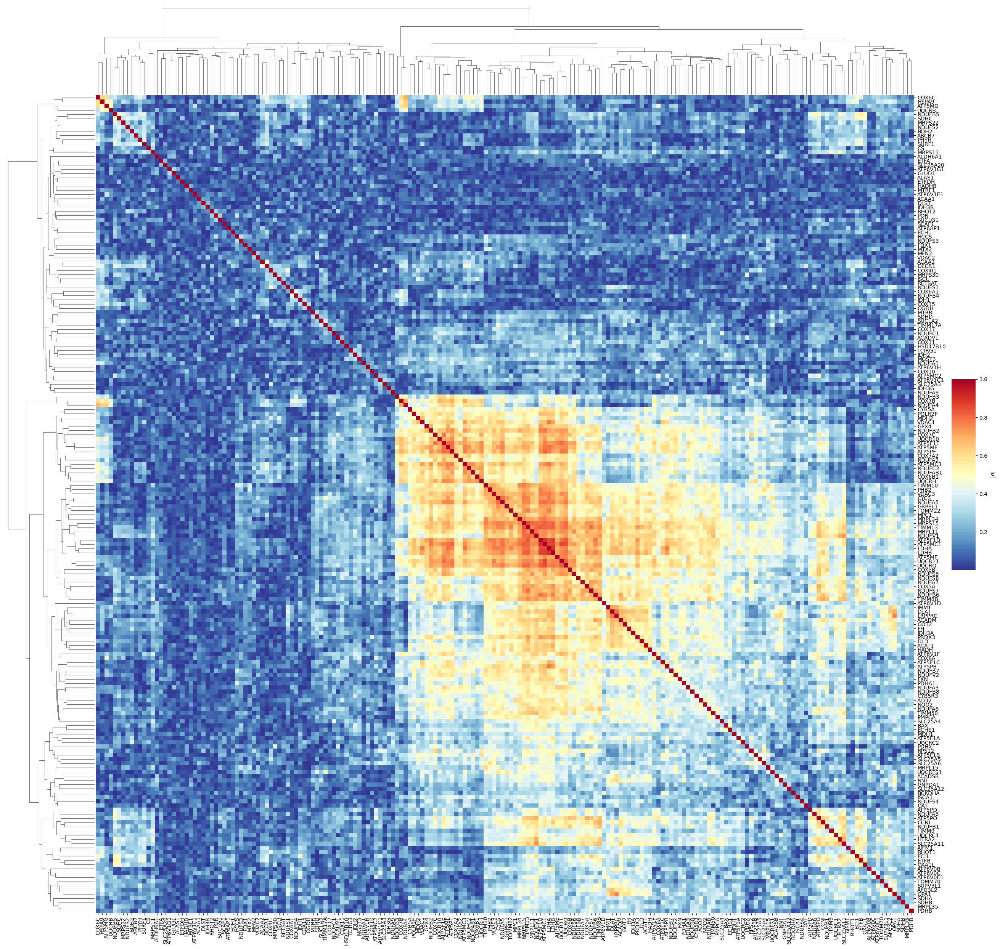

In [76]:
data = gl.data.to_df().assign(
    MetaCell=gl.data.obs["SEACells"]
).groupby("MetaCell", observed=False).mean()
data.columns.name = ""

clustergrid = sns.clustermap(
    data.corr().abs(),
    figsize=(25, 25),
    cbar_pos=(1, .4, .025, .2), 
    dendrogram_ratio=0.1, cmap="RdYlBu_r",
    xticklabels=gl.genes, yticklabels=gl.genes,
    cbar_kws={"label": r"$|\rho|$"},
    rasterized=True
)

plt.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_corr_all.pdf", **kwarg_savefig)

In [77]:
genes, ids = gl.select_correlated_genes(n_top=20)

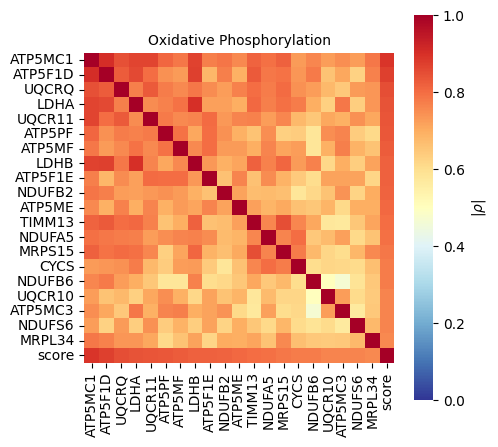

In [78]:
fig, ax = plt.subplots(figsize=(5, 5))

sns.heatmap(
    gl.get_matrix(with_score=True).corr().abs(),
    vmax=1, vmin=0, cmap="RdYlBu_r", square=True, 
    cbar_kws={"label": r"$|\rho|$"}, rasterized=True
)

ax.set(xlabel="", ylabel="");
ax.set_title(gl.category, fontsize="medium")

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_corr.pdf", **kwarg_savefig)

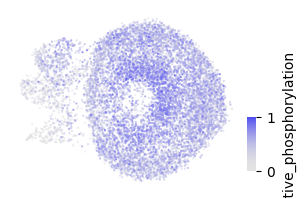

In [79]:
fig, ax = plt.subplots(figsize=(3, 3))

sce.pl.umap(
    gl.data, ax=ax, size=10,
    color=gl.score_prob_name, vmax=1, vmin=0, cmap=seurat,
    alpha=gl.data.obs[gl.score_prob_name], title=gl.caption
)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_score.pdf", **kwarg_savefig)

In [80]:
np.random.seed(0)
random.seed(0)

grn = HillClimbSearch(gene_list=gl, output_value="S_score_prob")

  0%|          | 0/1000000 [00:00<?, ?it/s]

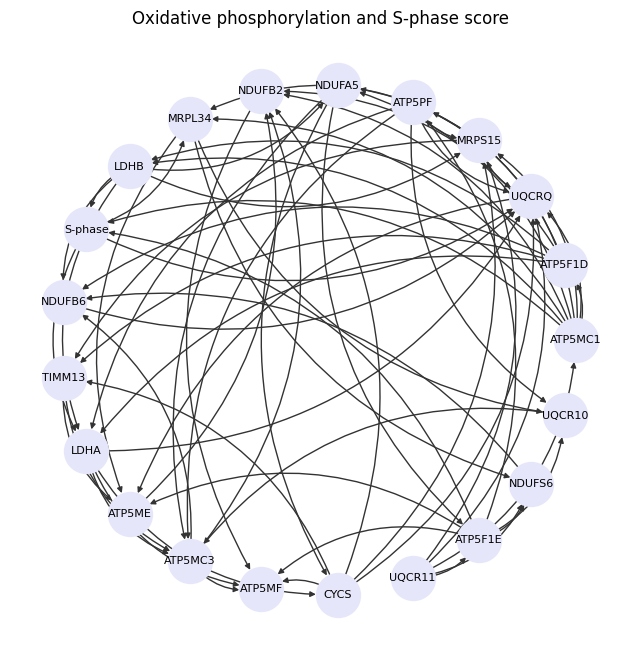

In [82]:
plt.subplots(figsize=(8, 8))

grn.draw_graph(
    with_labels=True, 
    output_label="S-phase",
    node_color="lavender", edge_color=".2", 
    node_size=1000, font_size=8, width=1,
    arrows=True, arrowsize=8,
    connectionstyle="arc3,rad=0.3"
)

plt.title(f"{gl.caption.replace("_", " ")} and S-phase score")
plt.show()

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_grn_all.pdf", **kwarg_savefig)

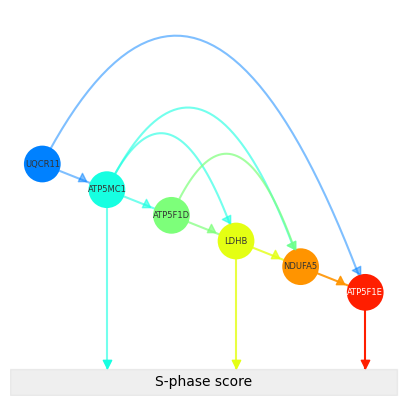

In [88]:
fig, ax = plt.subplots(figsize=(5, 5))

grn.draw_grn(
    ax=ax, 
    output_label="S-phase score",
    markersize=700, fontsize=6
)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_grn.pdf", **kwarg_savefig)

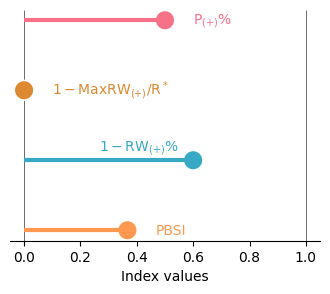

In [89]:
fig, ax = plt.subplots(figsize=(4, 3))

plot_grn_metrics(ax=ax, arr=grn.grn_arr)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_metrics.pdf", **kwarg_savefig)

---
## G2/M

In [139]:
gl = GeneList(
    adata=df, key="g2m_phase", category="G2-M Checkpoint", 
    database=hallmark, preset=True, caption="G2/M phase"
)

[Cache Hit] Loading 'g2m_phase'...


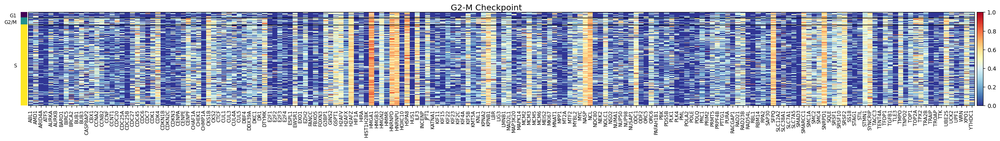

In [91]:
axes_dict = sc.pl.heatmap(
    gl.data,
    var_names=gl.genes,
    groupby="phase",
    gene_symbols="gene_name",
    standard_scale="var",
    show_gene_labels=True,
    swap_axes=False,
    figsize=(30, 3),
    show=False,
    cmap="RdYlBu_r",
    rasterized=True
)

heatmap_ax, group_ax = axes_dict.values()
group_ax.set(ylabel="");
group_ax.set_xticklabels(group_ax.get_xticklabels(), rotation=0)

fig = heatmap_ax.figure
fig.suptitle(
    gl.category, 
    fontsize="x-large",
    y=0.93
)

fig.savefig(f"{outputdir}/{gl.caption.replace("/", "-").replace(' ', '_')}_heatmap.pdf", **kwarg_savefig)

/home/yokano/.local/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/yokano/.local/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


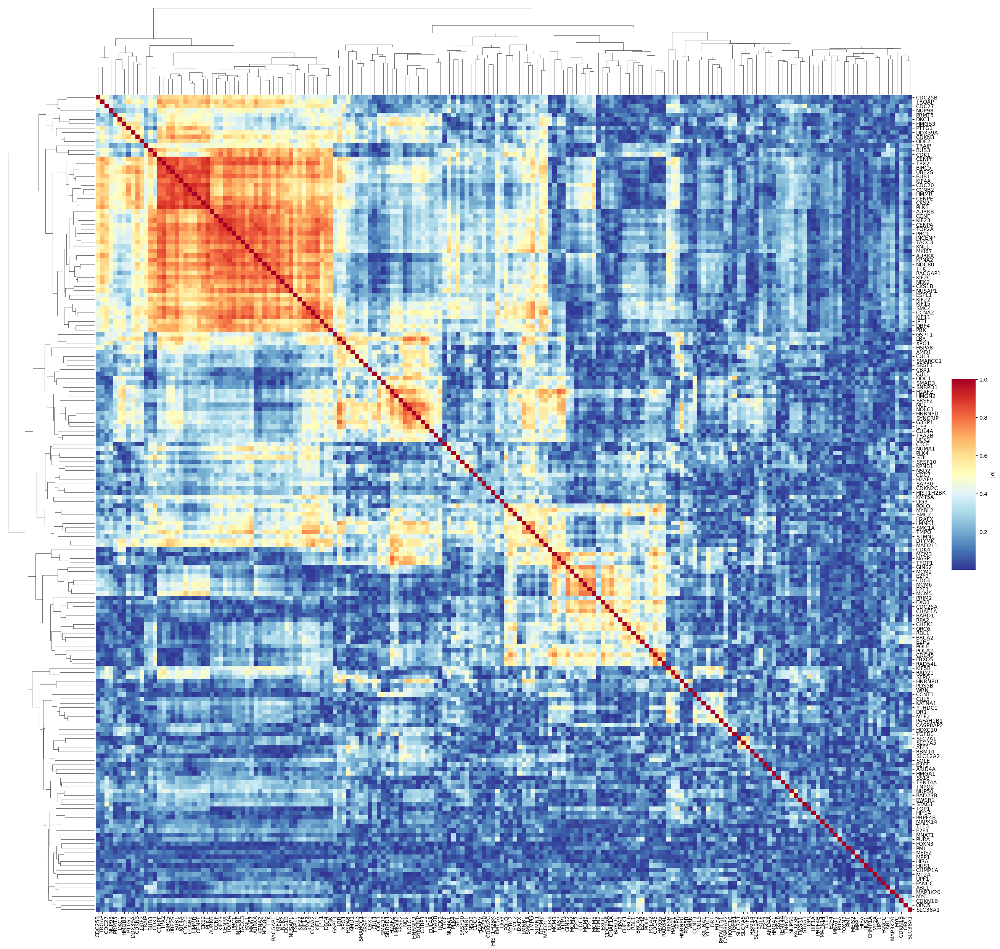

In [92]:
data = gl.data.to_df().assign(
    MetaCell=gl.data.obs["SEACells"]
).groupby("MetaCell", observed=False).mean()
data.columns.name = ""

clustergrid = sns.clustermap(
    data.corr().abs(),
    figsize=(25, 25),
    cbar_pos=(1, .4, .025, .2), 
    dendrogram_ratio=0.1, cmap="RdYlBu_r",
    xticklabels=gl.genes, yticklabels=gl.genes,
    cbar_kws={"label": r"$|\rho|$"},
    rasterized=True
)

plt.savefig(f"{outputdir}/{gl.caption.replace("/", "-").replace(' ', '_')}_corr_all.pdf", **kwarg_savefig)

In [100]:
genes, ids = gl.select_correlated_genes(n_top=20)

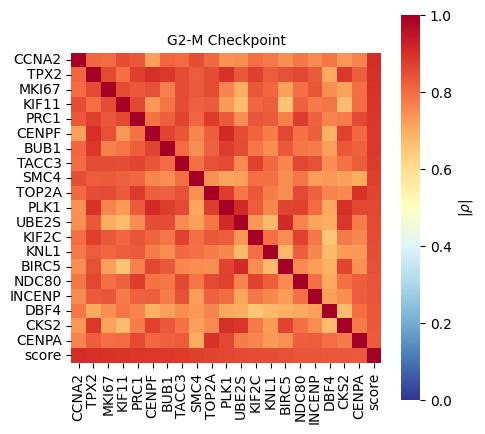

In [101]:
fig, ax = plt.subplots(figsize=(5, 5))

sns.heatmap(
    gl.get_matrix(with_score=True).corr().abs(),
    vmax=1, vmin=0, cmap="RdYlBu_r", square=True, 
    cbar_kws={"label": r"$|\rho|$"}, rasterized=True
)

ax.set(xlabel="", ylabel="");
ax.set_title(gl.category, fontsize="medium")

fig.savefig(f"{outputdir}/{gl.caption.replace("/", "-").replace(' ', '_')}_corr.pdf", **kwarg_savefig)

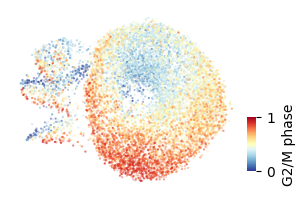

In [140]:
fig, ax = plt.subplots(figsize=(3, 3))

sce.pl.umap(
    gl.data, ax=ax, size=10,
    color=gl.score_prob_name, vmax=1, vmin=0, cmap="RdYlBu_r",
    alpha=gl.data.obs[gl.score_prob_name], title=gl.caption
)

fig.savefig(f"{outputdir}/{gl.caption.replace("/", "-").replace(' ', '_')}_score.pdf", **kwarg_savefig)

In [103]:
np.random.seed(0)
random.seed(0)

grn = HillClimbSearch(gene_list=gl, output_value="S_score_prob")

  0%|          | 0/1000000 [00:00<?, ?it/s]

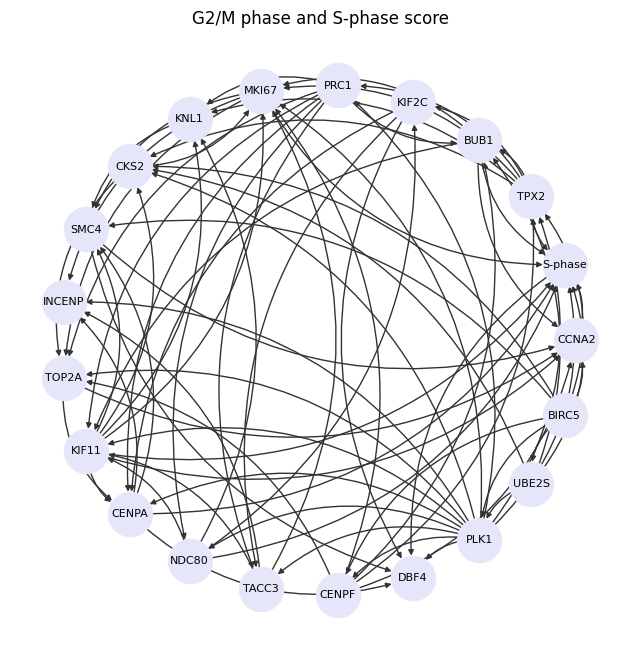

In [104]:
plt.subplots(figsize=(8, 8))

grn.draw_graph(
    with_labels=True, 
    output_label="S-phase",
    node_color="lavender", edge_color=".2", 
    node_size=1000, font_size=8, width=1,
    arrows=True, arrowsize=8,
    connectionstyle="arc3,rad=0.3"
)

plt.title(f"{gl.caption} and S-phase score")
plt.show()

fig.savefig(f"{outputdir}/{gl.caption.replace("/", "-").replace(' ', '_')}_grn_all.pdf", **kwarg_savefig)

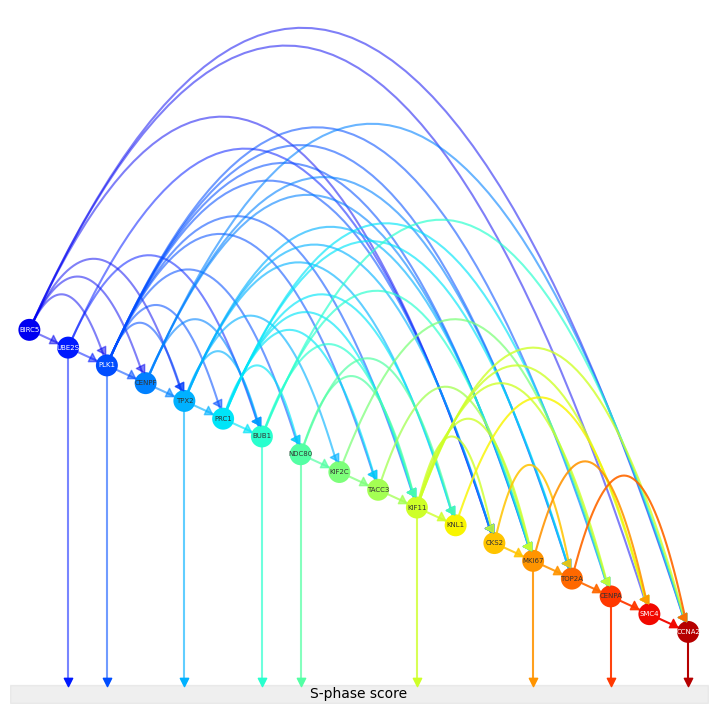

In [107]:
fig, ax = plt.subplots(figsize=(9, 9))

grn.draw_grn(
    ax=ax, 
    output_label="S-phase score",
    markersize=250, fontsize=5
)

fig.savefig(f"{outputdir}/{gl.caption.replace("/", "-").replace(' ', '_')}_grn.pdf", **kwarg_savefig)

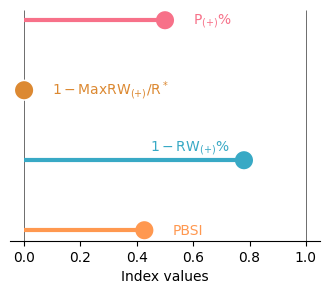

In [108]:
fig, ax = plt.subplots(figsize=(4, 3))

plot_grn_metrics(ax=ax, arr=grn.grn_arr)

fig.savefig(f"{outputdir}/{gl.caption.replace("/", "-").replace(' ', '_')}_metrics.pdf", **kwarg_savefig)

---
## TNF-$\alpha$

In [141]:
gl = GeneList(
    df, key="tnfa", category="TNF-alpha Signaling via NF-kB",
    database=hallmark, preset=True,
    caption="TNF Signaling"
)

[Cache Hit] Loading 'tnfa'...


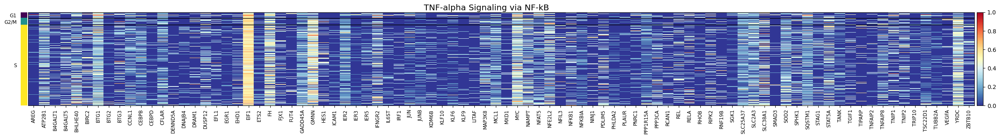

In [110]:
axes_dict = sc.pl.heatmap(
    gl.data,
    var_names=gl.genes,
    groupby="phase",
    gene_symbols="gene_name",
    standard_scale="var",
    show_gene_labels=True,
    swap_axes=False,
    figsize=(30, 3),
    show=False,
    cmap="RdYlBu_r",
    rasterized=True
)

heatmap_ax, group_ax = axes_dict.values()
group_ax.set(ylabel="");
group_ax.set_xticklabels(group_ax.get_xticklabels(), rotation=0)

fig = heatmap_ax.figure
fig.suptitle(
    gl.category, 
    fontsize="x-large",
    y=0.93
)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_heatmap.pdf", **kwarg_savefig)

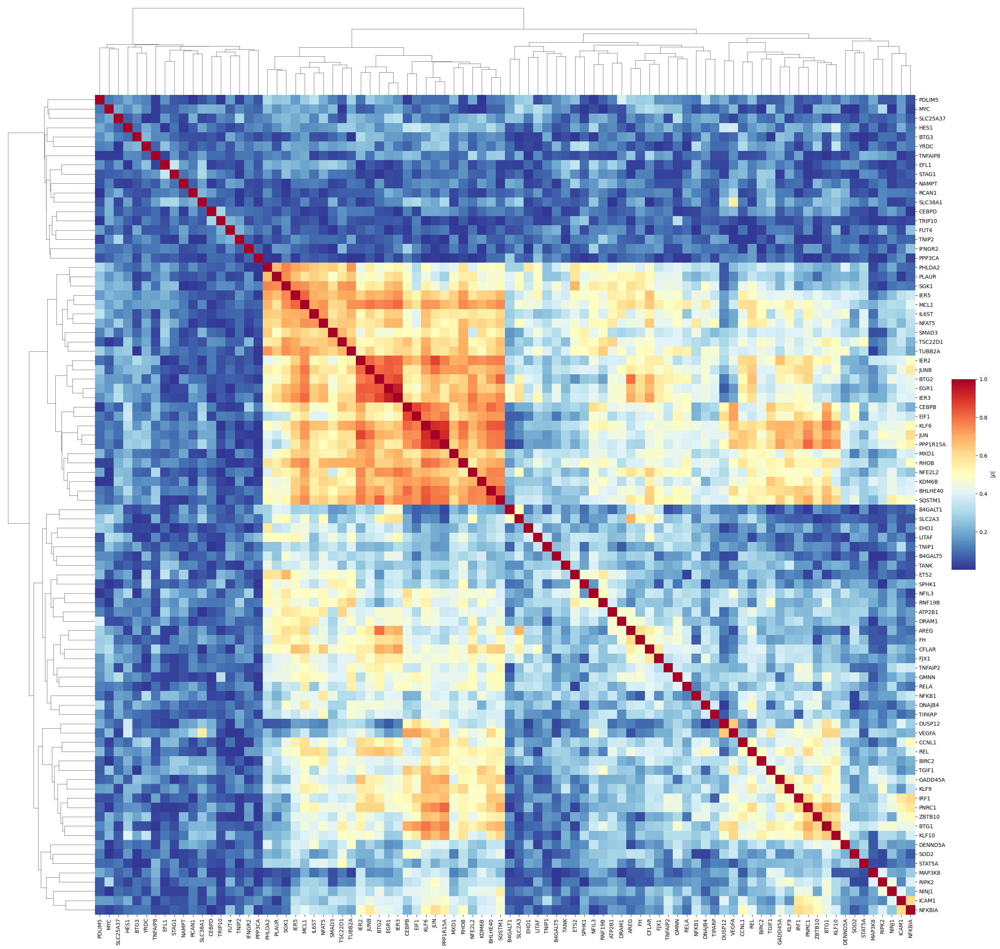

In [111]:
data = gl.data.to_df().assign(
    MetaCell=gl.data.obs["SEACells"]
).groupby("MetaCell", observed=False).mean()
data.columns.name = ""

clustergrid = sns.clustermap(
    data.corr().abs(),
    figsize=(25, 25),
    cbar_pos=(1, .4, .025, .2), 
    dendrogram_ratio=0.1, cmap="RdYlBu_r",
    xticklabels=gl.genes, yticklabels=gl.genes,
    cbar_kws={"label": r"$|\rho|$"},
    rasterized=True
)

plt.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_corr_all.pdf", **kwarg_savefig)

In [112]:
genes, ids = gl.select_independent_genes(n_top=20)

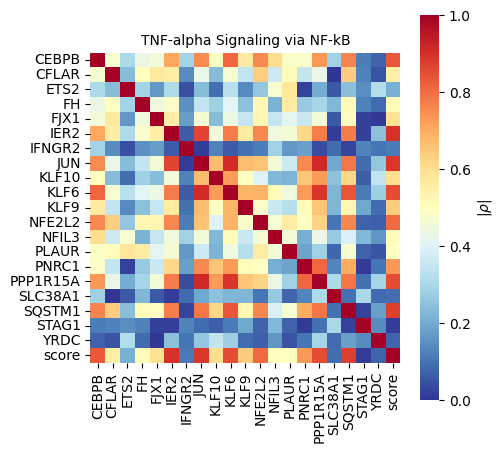

In [113]:
fig, ax = plt.subplots(figsize=(5, 5))

sns.heatmap(
    gl.get_matrix(with_score=True).corr().abs(),
    vmax=1, vmin=0, cmap="RdYlBu_r", square=True, 
    cbar_kws={"label": r"$|\rho|$"}, rasterized=True
)

ax.set(xlabel="", ylabel="");
ax.set_title(gl.category, fontsize="medium")

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_corr.pdf", **kwarg_savefig)

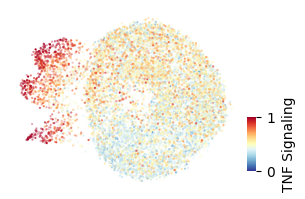

In [142]:
fig, ax = plt.subplots(figsize=(3, 3))

sce.pl.umap(
    gl.data, ax=ax, size=10,
    color=gl.score_prob_name, vmax=1, vmin=0, cmap="RdYlBu_r",
    alpha=gl.data.obs[gl.score_prob_name], title=gl.caption
)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_score.pdf", **kwarg_savefig)

In [115]:
np.random.seed(0)
random.seed(0)

grn = HillClimbSearch(gene_list=gl, output_value="S_score_prob")

  0%|          | 0/1000000 [00:00<?, ?it/s]

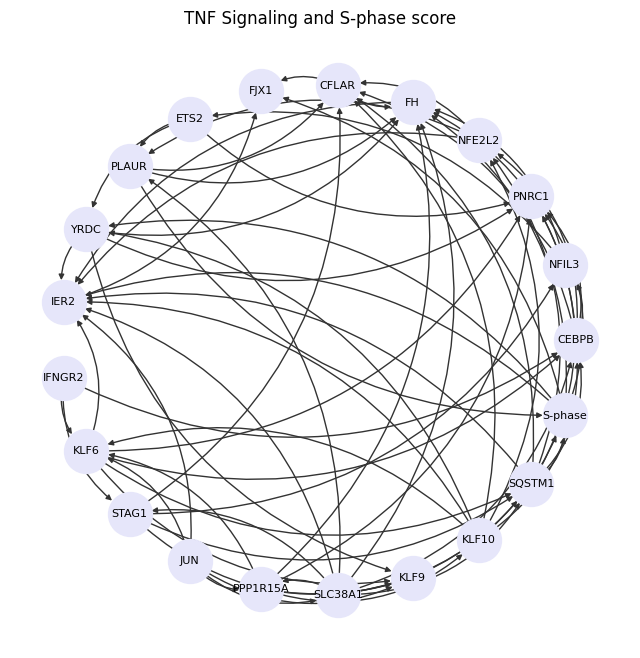

In [116]:
plt.subplots(figsize=(8, 8))

grn.draw_graph(
    with_labels=True, 
    output_label="S-phase",
    node_color="lavender", edge_color=".2", 
    node_size=1000, font_size=8, width=1,
    arrows=True, arrowsize=8,
    connectionstyle="arc3,rad=0.3"
)

plt.title(f"{gl.caption} and S-phase score")
plt.show()

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_grn_all.pdf", **kwarg_savefig)

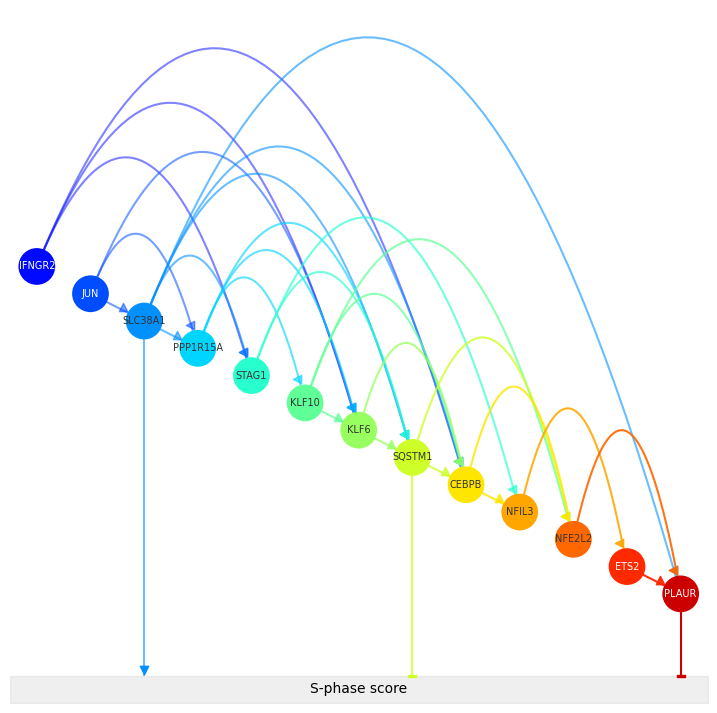

In [125]:
fig, ax = plt.subplots(figsize=(9, 9))

grn.draw_grn(
    ax=ax, 
    output_label="S-phase score",
    markersize=700, fontsize=7
)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_grn.pdf", **kwarg_savefig)

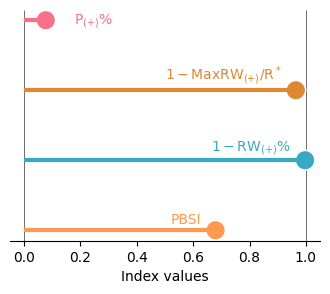

In [118]:
fig, ax = plt.subplots(figsize=(4, 3))

plot_grn_metrics(ax=ax, arr=grn.grn_arr)

fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_metrics.pdf", **kwarg_savefig)

In [126]:
ints1x = ["INTS10", "INTS13", "INTS14", "C7orf26"]
cleavage = ["INTS3", "INTS4", "INTS9", "INTS11"]
shoulder = ["INTS1", "INTS2", "INTS5", "INTS7", "INTS8"]

In [127]:
gls = {
    0: GeneList(
        df, key="ic_module1", category="INTS10–13–14–C7orf26 module (Module #1)",
        gene_names=ints1x, preset=True, caption="Module #1"
    ),
    1: GeneList(
        df, key="ic_module2", category="Cleavage module (Module #2)",
        gene_names=cleavage, preset=True, caption="Module #2"
    ),
    2: GeneList(
        df, key="ic_module3", category="Shoulder and backbone module (Module #3)",
        gene_names=shoulder, preset=True, caption="Module #3"
    ),
    3: GeneList(
        df, key="ic_modules_all", category="Integrator complex modules (Modules #1–3)",
        gene_names=ints1x + cleavage + shoulder, preset=False, caption="Integrator complex"
    ),
}

[Cache Hit] Loading 'ic_module1'...
[Cache Hit] Loading 'ic_module2'...
[Cache Hit] Loading 'ic_module3'...
[Cache Hit] Loading 'ic_modules_all'...


In [128]:
gls[3].data

AnnData object with n_obs × n_vars = 10689 × 13
    obs: 'gem_group', 'gene', 'gene_id', 'transcript', 'gene_transcript', 'sgID_AB', 'mitopercent', 'UMI_count', 'z_gemgroup_UMI', 'core_scale_factor', 'core_adjusted_UMI_count', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'SEACells', 'S_score', 'S_score_prob', 'G2M_score', 'G2M_score_prob', 'phase', 'Integrator_complex_score', 'Integrator_complex_score_prob'
    var: 'gene_name', 'chr', 'start', 'end', 'class', 'strand', 'length', 'in_matrix', 'mean', 'std', 'cv', 'fano', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'SEACells_colors', 'log1p', 'phase_colors', 'scrublet'
    obsm: 'X_pca', 'X_umap'

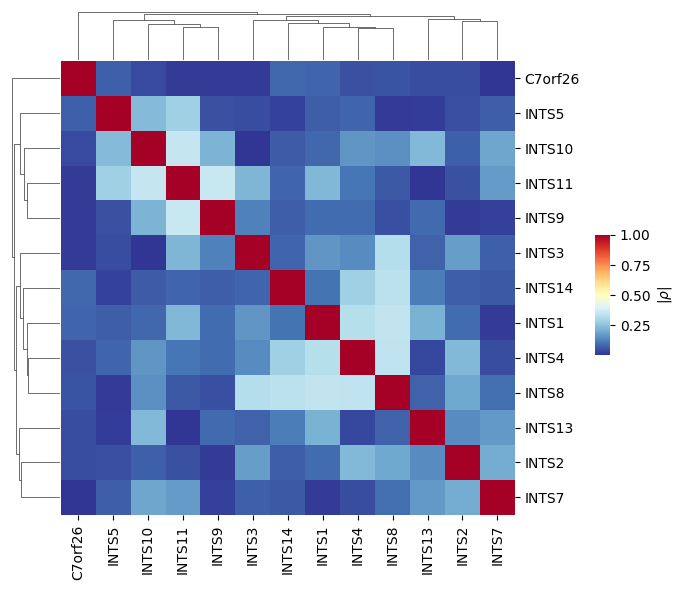

In [129]:
data = gls[3].data.to_df().assign(
    MetaCell=gls[3].data.obs["SEACells"]
).groupby("MetaCell", observed=False).mean()
data.columns.name = ""

clustergrid = sns.clustermap(
    data.corr().abs(),
    figsize=(6, 6),
    cbar_pos=(1, .4, .025, .2), 
    dendrogram_ratio=0.1, cmap="RdYlBu_r",
    xticklabels=gls[3].genes, yticklabels=gls[3].genes,
    cbar_kws={"label": r"$|\rho|$"}
)

# fig.savefig(f"{outputdir}/{gl.caption.replace(' ', '_')}_corr_all.pdf", **kwarg_savefig)

In [130]:
gls[3].selected_ids = gls[3].data.var_names
gls[3].selected_genes = gls[3].data.var["gene_name"]

In [131]:
gls[3]

In [132]:
np.random.seed(0)
random.seed(0)

grn = HillClimbSearch(gene_list=gls[3], output_value="S_score_prob")

  0%|          | 0/1000000 [00:00<?, ?it/s]

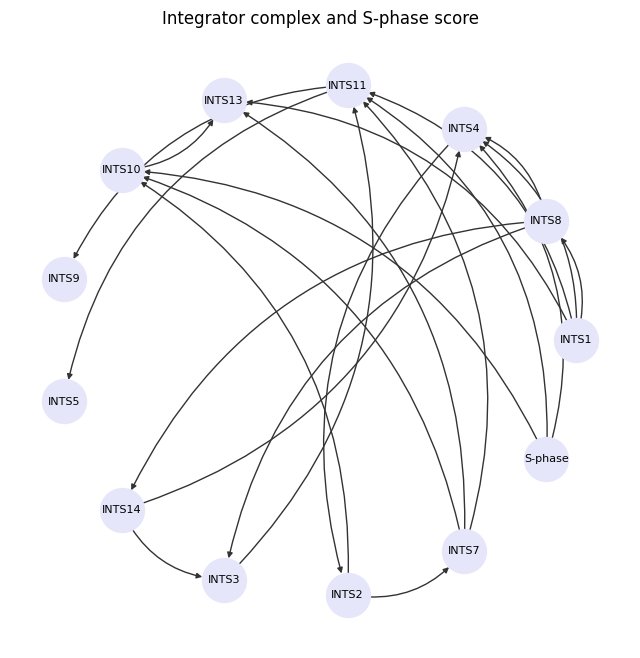

In [133]:
plt.subplots(figsize=(8, 8))

grn.draw_graph(
    with_labels=True, 
    output_label="S-phase",
    node_color='lavender', edge_color='.2', 
    node_size=1000, font_size=8, width=1,
    arrows=True, arrowsize=8, # 矢印を大きく
    connectionstyle='arc3,rad=0.3' # 矢印が重ならないよう少し曲げる
)

plt.title(f"{gls[3].caption} and S-phase score")
plt.show()

fig.savefig(f"{outputdir}/{gls[3].caption.replace("/", "-").replace(' ', '_')}_grn_all.pdf", **kwarg_savefig)

/rshare1/ZETTAI_path_WA_slash_home_KARA/home/yokano/WhyDOE_RWD_Analysis/tools/grn/_hill_climb.py:187: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(1.5, 1.5 + n_factor)


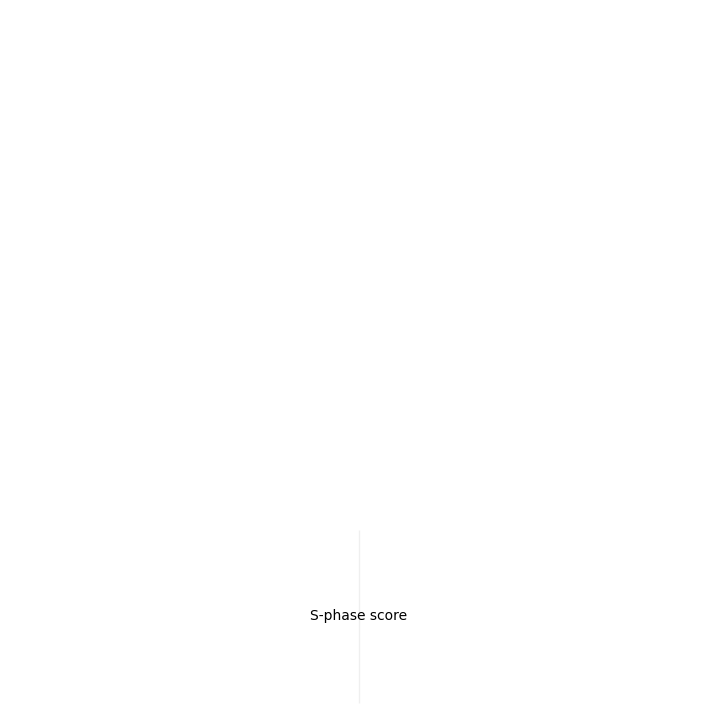

In [134]:
fig, ax = plt.subplots(figsize=(9, 9))

grn.draw_grn(
    ax=ax, 
    output_label="S-phase score",
    markersize=300, fontsize=5
)

fig.savefig(f"{outputdir}/{gl.caption.replace("/", "-").replace(' ', '_')}_grn.pdf", **kwarg_savefig)